In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import os
os.chdir("/home/dalai/GNN_E")

import pandas as pd
from math import ceil
import gc
from torchsummary import summary
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

import torch
import torch.optim as optim

# Out libraries
from utils_models import *
from FNN.FNN_model import *

print(torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
print(torch.__version__)

/home/dalai/.conda/envs/gat_gpu/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True
cuda
1.13.1+cu116


In [3]:
# Load all movies with labels csv
df_all_movies = pd.read_csv("data/processed/all_movies_labelled_13_single.csv")
num_classes = 13 # based on df_movie choosen
batch_size = 32
test_train_splitting_mode = "Vertical"
percentage_train = 0.8
percentage_val = 0.2


# Df rest only in case you want to predict between rest and movie
df_rest = pd.read_csv("/home/dalai/GNN_E/data/raw/rest/Rest_compiled414_processed.csv")

In [4]:
if test_train_splitting_mode == "Vertical":
    #df_train, df_test = split_train_test_vertically(
    #    df_all_movies, 
    #   test_movies_dict = {"BigBuckBunny": 2, "FirstBite": 4, "Superhero": 9})
    # In case use balanced dataset
    df_train, df_test = split_train_test_vertically(
        df_all_movies, 
        test_movies_dict = {"FirstBite": 4, "Superhero": 9, "YouAgain": 13})
    df_val = df_train[df_train.id == 99] #make sure to be empty
elif test_train_splitting_mode == "Horizontal":
    df_train, df_val, df_test = split_train_val_test_horizontally(
        df_all_movies, 
        percentage_train=percentage_train, 
        percentage_val=percentage_val, #0 to not have nay val set
        path_pickle_delay="data/raw/labels/run_onsets.pkl",
        path_movie_title_mapping="data/raw/labels/category_mapping_movies.csv", 
        tr_len=1.3)
elif test_train_splitting_mode == "MovieRest":
    df_rest = pd.read_csv("data/raw/rest/Rest_compiled414_processed.csv")
    df_train, df_test = split_train_test_rest_classification(df_all_movies, df_rest)
    df_val = df_train[df_train.id == 99] #make sure to be empty

In [5]:
half_wind_size = 4

X_train, y_train = create_feature_label_tensors_for_FNN(
    df_train, 
    sizewind=half_wind_size
)
print(X_train.shape) # samples x nodes x window
print(y_train.shape) # samples

X_test, y_test = create_feature_label_tensors_for_FNN(
    df_test, 
    sizewind=half_wind_size
)
print(X_test.shape) # samples x nodes x window
print(y_test.shape) # samples

Movies in this df: [ 0  1  2  3  5  6  7  8 10 11 12]
Processing movie: 0, subject: 1, timepoint: 0/382
Processing movie: 0, subject: 1, timepoint: 1/382
Processing movie: 0, subject: 1, timepoint: 2/382
Processing movie: 0, subject: 1, timepoint: 3/382
Processing movie: 0, subject: 1, timepoint: 4/382
Processing movie: 0, subject: 1, timepoint: 5/382
Processing movie: 0, subject: 1, timepoint: 6/382
Processing movie: 0, subject: 1, timepoint: 7/382
Processing movie: 0, subject: 1, timepoint: 8/382
Processing movie: 0, subject: 1, timepoint: 9/382
Processing movie: 0, subject: 1, timepoint: 10/382
Processing movie: 0, subject: 1, timepoint: 11/382
Processing movie: 0, subject: 1, timepoint: 12/382
Processing movie: 0, subject: 1, timepoint: 13/382
Processing movie: 0, subject: 1, timepoint: 14/382
Processing movie: 0, subject: 1, timepoint: 15/382
Processing movie: 0, subject: 1, timepoint: 16/382
Processing movie: 0, subject: 1, timepoint: 17/382
Processing movie: 0, subject: 1, timep

In [10]:
# Reshape to (samples, nodes * window)

samples_train = X_train.shape[0]
X_train = X_train.view(samples_train, -1)  # or X.reshape(samples, nodes * window)
print(X_train.shape)

samples_test = X_test.shape[0]
X_test = X_test.view(samples_test, -1)  # or X.reshape(samples, nodes * window)
print(X_test.shape)

torch.Size([165570, 3726])
torch.Size([55980, 3726])


In [11]:
# Move tensors to gpu
X_train.to(device)
y_train.to(device)
X_test.to(device)
y_test.to(device)

tensor([7, 7, 7,  ..., 2, 2, 2], device='cuda:0')

In [12]:
# Create Model

n_nodes = 414

model = FNN(
    input_size = n_nodes * (1 + 2*half_wind_size), #n_features = n_nodes x window_size
    output_size = num_classes, #n_classes, it return softmax
    hidden_dims = [1500, 1000, 500, 300, 100],  # List of hidden layer sizes
    initializer="he"
)

model.to(device)

summary(model, (batch_size, n_nodes * (1 + 2*half_wind_size)))  # Adjust input size accordingly


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1             [-1, 32, 1500]       5,590,500
         LeakyReLU-2             [-1, 32, 1500]               0
            Linear-3             [-1, 32, 1000]       1,501,000
         LeakyReLU-4             [-1, 32, 1000]               0
            Linear-5              [-1, 32, 500]         500,500
         LeakyReLU-6              [-1, 32, 500]               0
            Linear-7              [-1, 32, 300]         150,300
         LeakyReLU-8              [-1, 32, 300]               0
            Linear-9              [-1, 32, 100]          30,100
        LeakyReLU-10              [-1, 32, 100]               0
           Linear-11               [-1, 32, 13]           1,313
Total params: 7,773,713
Trainable params: 7,773,713
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.45
Forw

In [15]:
# Train

losses_train, losses_val = model.train_model(
                                X_train = X_train, 
                                Y_train = y_train,  
                                X_val = X_test, 
                                Y_val = y_test, 
                                optimizer="adam", 
                                learning_rate=0.0001, 
                                epochs=50, 
                                batch_size=batch_size
                    )

Epoch 1/50: 100%|██████████| 5175/5175 [00:30<00:00, 172.05batch/s]


Epoch 1/50, Train Loss: 0.4849, Val Loss: 6.3984


Epoch 2/50: 100%|██████████| 5175/5175 [00:29<00:00, 175.72batch/s]


Epoch 2/50, Train Loss: 0.3875, Val Loss: 6.9459


Epoch 3/50: 100%|██████████| 5175/5175 [00:32<00:00, 161.62batch/s]


Epoch 3/50, Train Loss: 0.3338, Val Loss: 7.3893


Epoch 4/50: 100%|██████████| 5175/5175 [00:31<00:00, 165.89batch/s]


Epoch 4/50, Train Loss: 0.2930, Val Loss: 7.6903


Epoch 5/50: 100%|██████████| 5175/5175 [00:30<00:00, 169.55batch/s]


Epoch 5/50, Train Loss: 0.2581, Val Loss: 8.2283


Epoch 6/50: 100%|██████████| 5175/5175 [00:32<00:00, 159.05batch/s]


Epoch 6/50, Train Loss: 0.2445, Val Loss: 8.9482


Epoch 7/50: 100%|██████████| 5175/5175 [00:32<00:00, 160.36batch/s]


Epoch 7/50, Train Loss: 0.2223, Val Loss: 8.6082


Epoch 8/50: 100%|██████████| 5175/5175 [00:43<00:00, 118.00batch/s]


Epoch 8/50, Train Loss: 0.2068, Val Loss: 9.1610


Epoch 9/50: 100%|██████████| 5175/5175 [00:42<00:00, 121.61batch/s]


Epoch 9/50, Train Loss: 0.1978, Val Loss: 9.0777


Epoch 10/50: 100%|██████████| 5175/5175 [00:31<00:00, 164.12batch/s]


Epoch 10/50, Train Loss: 0.1849, Val Loss: 9.4760


Epoch 11/50: 100%|██████████| 5175/5175 [00:31<00:00, 163.11batch/s]


Epoch 11/50, Train Loss: 0.1754, Val Loss: 10.0825


Epoch 12/50: 100%|██████████| 5175/5175 [00:30<00:00, 169.99batch/s]


Epoch 12/50, Train Loss: 0.1692, Val Loss: 10.1493


Epoch 13/50: 100%|██████████| 5175/5175 [00:28<00:00, 179.07batch/s]


Epoch 13/50, Train Loss: 0.1599, Val Loss: 10.2496


Epoch 14/50: 100%|██████████| 5175/5175 [00:31<00:00, 165.21batch/s]


Epoch 14/50, Train Loss: 0.1561, Val Loss: 10.0775


Epoch 15/50: 100%|██████████| 5175/5175 [00:30<00:00, 168.70batch/s]


Epoch 15/50, Train Loss: 0.1442, Val Loss: 10.2788


Epoch 16/50: 100%|██████████| 5175/5175 [00:31<00:00, 165.13batch/s]


Epoch 16/50, Train Loss: 0.1440, Val Loss: 10.7485


Epoch 17/50: 100%|██████████| 5175/5175 [00:31<00:00, 166.23batch/s]


Epoch 17/50, Train Loss: 0.1385, Val Loss: 10.3495


Epoch 18/50: 100%|██████████| 5175/5175 [00:31<00:00, 161.98batch/s]


Epoch 18/50, Train Loss: 0.1387, Val Loss: 10.7675


Epoch 19/50: 100%|██████████| 5175/5175 [00:31<00:00, 165.65batch/s]


Epoch 19/50, Train Loss: 0.1284, Val Loss: 10.4383


Epoch 20/50: 100%|██████████| 5175/5175 [00:30<00:00, 167.34batch/s]


Epoch 20/50, Train Loss: 0.1264, Val Loss: 11.1990


Epoch 21/50: 100%|██████████| 5175/5175 [00:32<00:00, 158.44batch/s]


Epoch 21/50, Train Loss: 0.1250, Val Loss: 11.6865


Epoch 22/50: 100%|██████████| 5175/5175 [00:31<00:00, 164.85batch/s]


Epoch 22/50, Train Loss: 0.1228, Val Loss: 10.9797


Epoch 23/50: 100%|██████████| 5175/5175 [00:32<00:00, 159.59batch/s]


Epoch 23/50, Train Loss: 0.1185, Val Loss: 12.0877


Epoch 24/50: 100%|██████████| 5175/5175 [00:32<00:00, 161.43batch/s]


Epoch 24/50, Train Loss: 0.1116, Val Loss: 11.6831


Epoch 25/50: 100%|██████████| 5175/5175 [00:31<00:00, 163.30batch/s]


Epoch 25/50, Train Loss: 0.1133, Val Loss: 12.4012


Epoch 26/50: 100%|██████████| 5175/5175 [00:29<00:00, 173.94batch/s]


Epoch 26/50, Train Loss: 0.1110, Val Loss: 11.5184


Epoch 27/50: 100%|██████████| 5175/5175 [00:30<00:00, 169.66batch/s]


Epoch 27/50, Train Loss: 0.1122, Val Loss: 11.5988


Epoch 28/50: 100%|██████████| 5175/5175 [00:30<00:00, 171.88batch/s]


Epoch 28/50, Train Loss: 0.1050, Val Loss: 11.5654


Epoch 29/50: 100%|██████████| 5175/5175 [00:30<00:00, 167.79batch/s]


Epoch 29/50, Train Loss: 0.1078, Val Loss: 13.2720


Epoch 30/50: 100%|██████████| 5175/5175 [00:32<00:00, 159.14batch/s]


Epoch 30/50, Train Loss: 0.1038, Val Loss: 12.0917


Epoch 31/50: 100%|██████████| 5175/5175 [00:33<00:00, 153.37batch/s]


Epoch 31/50, Train Loss: 0.1048, Val Loss: 12.4924


Epoch 32/50: 100%|██████████| 5175/5175 [00:33<00:00, 155.82batch/s]


Epoch 32/50, Train Loss: 0.0989, Val Loss: 12.3284


Epoch 33/50: 100%|██████████| 5175/5175 [00:33<00:00, 155.00batch/s]


Epoch 33/50, Train Loss: 0.1019, Val Loss: 13.5249


Epoch 34/50: 100%|██████████| 5175/5175 [00:35<00:00, 145.59batch/s]


Epoch 34/50, Train Loss: 0.0975, Val Loss: 13.0138


Epoch 35/50: 100%|██████████| 5175/5175 [00:35<00:00, 146.51batch/s]


Epoch 35/50, Train Loss: 0.0971, Val Loss: 13.7482


Epoch 36/50: 100%|██████████| 5175/5175 [00:30<00:00, 169.96batch/s]


Epoch 36/50, Train Loss: 0.0978, Val Loss: 12.5440


Epoch 37/50: 100%|██████████| 5175/5175 [00:30<00:00, 168.17batch/s]


Epoch 37/50, Train Loss: 0.0969, Val Loss: 13.8593


Epoch 38/50: 100%|██████████| 5175/5175 [00:30<00:00, 169.15batch/s]


Epoch 38/50, Train Loss: 0.0965, Val Loss: 12.5538


Epoch 39/50: 100%|██████████| 5175/5175 [00:31<00:00, 163.51batch/s]


Epoch 39/50, Train Loss: 0.0878, Val Loss: 12.6850


Epoch 40/50: 100%|██████████| 5175/5175 [00:30<00:00, 170.21batch/s]


Epoch 40/50, Train Loss: 0.0920, Val Loss: 13.1542


Epoch 41/50: 100%|██████████| 5175/5175 [00:31<00:00, 163.80batch/s]


Epoch 41/50, Train Loss: 0.0922, Val Loss: 12.8352


Epoch 42/50: 100%|██████████| 5175/5175 [00:30<00:00, 168.14batch/s]


Epoch 42/50, Train Loss: 0.0858, Val Loss: 13.1498


Epoch 43/50: 100%|██████████| 5175/5175 [00:31<00:00, 166.25batch/s]


Epoch 43/50, Train Loss: 0.0880, Val Loss: 13.6690


Epoch 44/50: 100%|██████████| 5175/5175 [00:31<00:00, 165.97batch/s]


Epoch 44/50, Train Loss: 0.0891, Val Loss: 15.5693


Epoch 45/50: 100%|██████████| 5175/5175 [00:29<00:00, 176.44batch/s]


Epoch 45/50, Train Loss: 0.0830, Val Loss: 14.8327


Epoch 46/50: 100%|██████████| 5175/5175 [00:33<00:00, 155.82batch/s]


Epoch 46/50, Train Loss: 0.0892, Val Loss: 14.7227


Epoch 47/50: 100%|██████████| 5175/5175 [00:33<00:00, 155.97batch/s]


Epoch 47/50, Train Loss: 0.0861, Val Loss: 14.7281


Epoch 48/50: 100%|██████████| 5175/5175 [00:35<00:00, 143.89batch/s]


Epoch 48/50, Train Loss: 0.0843, Val Loss: 13.8150


Epoch 49/50: 100%|██████████| 5175/5175 [00:43<00:00, 119.83batch/s]


Epoch 49/50, Train Loss: 0.0856, Val Loss: 15.5208


Epoch 50/50: 100%|██████████| 5175/5175 [00:51<00:00, 100.19batch/s]


Epoch 50/50, Train Loss: 0.0848, Val Loss: 14.5057


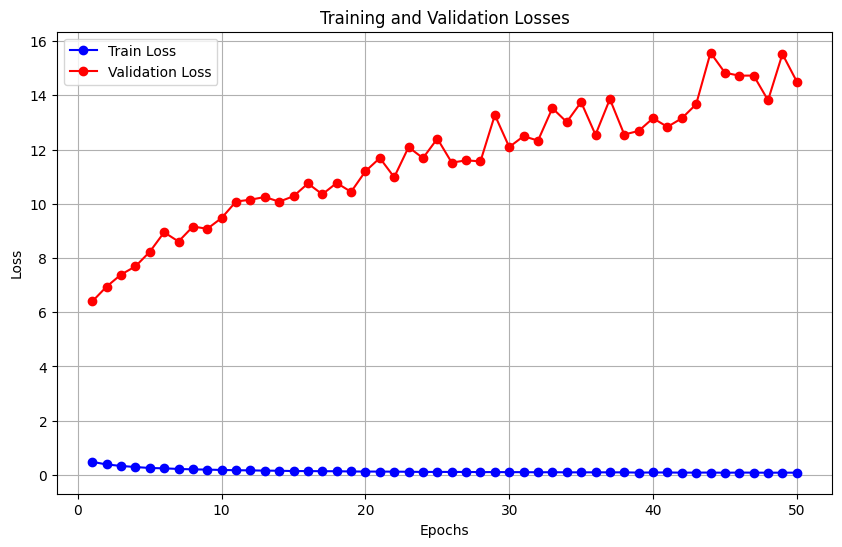

In [16]:
# plots losses

epochs = range(1, len(losses_train) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, losses_train, label='Train Loss', color='blue', marker='o')
plt.plot(epochs, losses_val, label='Validation Loss', color='red', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Losses')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Predict on test
y_test_pred = model.predict(X_test)
y_test_pred

# Ensure y_test_pred is on the CPU before converting it to NumPy
y_test_pred_cpu = y_test_pred.cpu().numpy()

# Now you can calculate accuracy
accuracy = accuracy_score(y_test, y_test_pred_cpu)

print(f"Accuracy: {accuracy * 100:.2f}%")

# Ensure tensors are converted to numpy
y_test = y_test.cpu().detach().numpy()
y_test_pred = y_test_pred.cpu().detach().numpy()

Accuracy: 9.30%


Accuracy: 0.0930
Precision: 0.0930
Recall: 0.0930
F1 Score: 0.0930
Accuracy for class 0: 1.69%
Accuracy for class 1: 19.82%
Accuracy for class 2: 10.89%
Accuracy for class 3: 5.24%
Accuracy for class 4: 1.45%
Accuracy for class 5: 11.56%
Accuracy for class 6: 3.46%
Accuracy for class 7: 11.11%
Accuracy for class 8: 8.62%
Accuracy for class 9: 4.15%
Accuracy for class 10: 5.80%
Accuracy for class 11: 11.60%
Accuracy for class 12: 11.14%


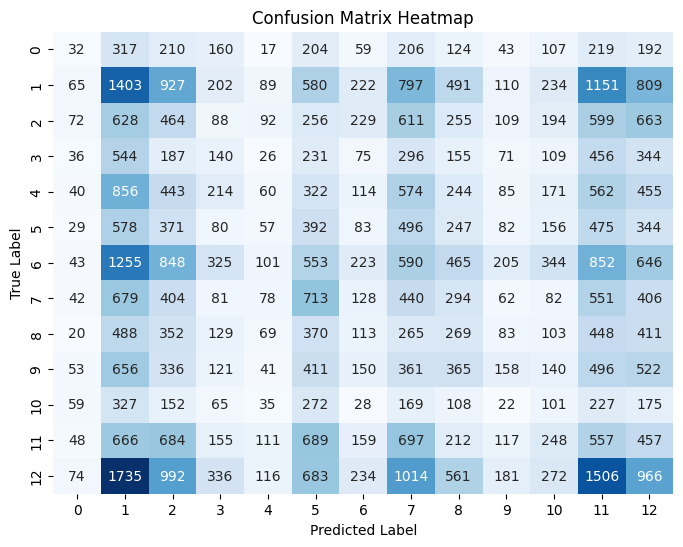

In [23]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Calculate overall metrics
accuracy = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred, average='micro')  # 'micro' for multi-class
recall = recall_score(y_test, y_test_pred, average='micro')  # 'micro' for multi-class
f1 = f1_score(y_test, y_test_pred, average='micro')  # 'micro' for multi-class

# Print overall metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Calculate accuracy per class
class_accuracies = {}
for i, label in enumerate(np.unique(y_test)):
    true_positives = conf_matrix[i, i]
    total_samples = conf_matrix[i].sum()
    class_accuracy = true_positives / total_samples if total_samples > 0 else 0.0
    class_accuracies[label] = class_accuracy
    print(f"Accuracy for class {label}: {class_accuracy*100:.2f}%")

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
